# Principal Component Analysis

Seja bem vindo ao notebook sobre **PCA (Principal Component Analysis)**!

PCA não é um algoritmo de ML *per se*, acredito que seria melhor chamado de uma técnica, que é muito usada para **redução de dimensionalidade** e para análise das variáveis do seu modelo. Ou seja, podemos usar o PCA para, por exemplo, plotar dados que originalmente possuiriam variáveis demais para serem plotados, essa é uma das aplicações, e vou mostrar isso aqui.

Se trata de uma técnica que irá realizar transformações nos seus dados, usando um processo chamado **Single Value Decomposition (SVD)**, que não aprofundarei tanto neste notebook (mas vou deixar links no final, caso você queira entender melhor a matemática por trás), para analisar a relação entre as variáveis do seu dataset, verificando quais relações explicam melhor a variação dentro de seus dados.

Como não pretendo me aprofundar muito na matemática, eu vou partir diretamente para a parte prática e vou explicando algumas coisas ao longo do caminho. Mas, de toda forma, eu recomendo, caso você queira ter um entendimento mais completo do PCA, que verifique os links na referência ao final do notebook.

## Vamos à parte prática...

### Carregando os dados:

In [1]:
# Importando as libs:

import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.datasets import load_breast_cancer # <- Vou trabalhar com esse dataset
from sklearn.preprocessing import StandardScaler # Para normalizar a base
from sklearn.decomposition import PCA # Para fazer o PCA

In [2]:
# Vou criar um dataframe com os nossos dados:

cancer = load_breast_cancer()
df = pd.DataFrame(cancer['data'],columns=cancer['feature_names'])
df.head(10)

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,17.99,10.38,122.80,1001.0,0.11840,0.27760,0.30010,0.14710,0.2419,0.07871,...,25.38,17.33,184.60,2019.0,0.1622,0.6656,0.7119,0.2654,0.4601,0.11890
1,20.57,17.77,132.90,1326.0,0.08474,0.07864,0.08690,0.07017,0.1812,0.05667,...,24.99,23.41,158.80,1956.0,0.1238,0.1866,0.2416,0.1860,0.2750,0.08902
2,19.69,21.25,130.00,1203.0,0.10960,0.15990,0.19740,0.12790,0.2069,0.05999,...,23.57,25.53,152.50,1709.0,0.1444,0.4245,0.4504,0.2430,0.3613,0.08758
3,11.42,20.38,77.58,386.1,0.14250,0.28390,0.24140,0.10520,0.2597,0.09744,...,14.91,26.50,98.87,567.7,0.2098,0.8663,0.6869,0.2575,0.6638,0.17300
4,20.29,14.34,135.10,1297.0,0.10030,0.13280,0.19800,0.10430,0.1809,0.05883,...,22.54,16.67,152.20,1575.0,0.1374,0.2050,0.4000,0.1625,0.2364,0.07678
5,12.45,15.70,82.57,477.1,0.12780,0.17000,0.15780,0.08089,0.2087,0.07613,...,15.47,23.75,103.40,741.6,0.1791,0.5249,0.5355,0.1741,0.3985,0.12440
6,18.25,19.98,119.60,1040.0,0.09463,0.10900,0.11270,0.07400,0.1794,0.05742,...,22.88,27.66,153.20,1606.0,0.1442,0.2576,0.3784,0.1932,0.3063,0.08368
7,13.71,20.83,90.20,577.9,0.11890,0.16450,0.09366,0.05985,0.2196,0.07451,...,17.06,28.14,110.60,897.0,0.1654,0.3682,0.2678,0.1556,0.3196,0.11510
8,13.00,21.82,87.50,519.8,0.12730,0.19320,0.18590,0.09353,0.2350,0.07389,...,15.49,30.73,106.20,739.3,0.1703,0.5401,0.5390,0.2060,0.4378,0.10720
9,12.46,24.04,83.97,475.9,0.11860,0.23960,0.22730,0.08543,0.2030,0.08243,...,15.09,40.68,97.65,711.4,0.1853,1.0580,1.1050,0.2210,0.4366,0.20750


In [3]:
df.shape

(569, 30)

In [4]:
df.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,...,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000,569.000000
mean,14.127292,19.289649,91.969033,654.889104,0.096360,0.104341,0.088799,0.048919,0.181162,0.062798,...,16.269190,25.677223,107.261213,880.583128,0.132369,0.254265,0.272188,0.114606,0.290076,0.083946
std,3.524049,4.301036,24.298981,351.914129,0.014064,0.052813,0.079720,0.038803,0.027414,0.007060,...,4.833242,6.146258,33.602542,569.356993,0.022832,0.157336,0.208624,0.065732,0.061867,0.018061
min,6.981000,9.710000,43.790000,143.500000,0.052630,0.019380,0.000000,0.000000,0.106000,0.049960,...,7.930000,12.020000,50.410000,185.200000,0.071170,0.027290,0.000000,0.000000,0.156500,0.055040
25%,11.700000,16.170000,75.170000,420.300000,0.086370,0.064920,0.029560,0.020310,0.161900,0.057700,...,13.010000,21.080000,84.110000,515.300000,0.116600,0.147200,0.114500,0.064930,0.250400,0.071460
50%,13.370000,18.840000,86.240000,551.100000,0.095870,0.092630,0.061540,0.033500,0.179200,0.061540,...,14.970000,25.410000,97.660000,686.500000,0.131300,0.211900,0.226700,0.099930,0.282200,0.080040
75%,15.780000,21.800000,104.100000,782.700000,0.105300,0.130400,0.130700,0.074000,0.195700,0.066120,...,18.790000,29.720000,125.400000,1084.000000,0.146000,0.339100,0.382900,0.161400,0.317900,0.092080
max,28.110000,39.280000,188.500000,2501.000000,0.163400,0.345400,0.426800,0.201200,0.304000,0.097440,...,36.040000,49.540000,251.200000,4254.000000,0.222600,1.058000,1.252000,0.291000,0.663800,0.207500


Acima, carreguei dados de câncer de mama diretamente do `sklearn`, se trata de um dataframe com 30 variáveis explicativas sobre 569 amostras de câncer de mama. Além dessas variáveis explicativas, o nosso dataset também trouxe se os tumores são benignos ou malignos:

In [5]:
cancer.keys()

dict_keys(['data', 'target', 'frame', 'target_names', 'DESCR', 'feature_names', 'filename'])

In [6]:
cancer['target']

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0, 0,
       1, 1, 1, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0,
       1, 1, 1, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 0, 1, 1, 0, 1,
       1, 1, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1,
       1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 0, 1, 1, 0, 0, 1, 0, 0,
       0, 0, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 0, 1, 1, 0, 0,
       1, 1, 1, 0, 1, 1, 1, 1, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 1, 1, 1, 1, 1, 1, 0, 1, 0, 1, 1, 0, 1, 1, 0, 1, 0, 0, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 0,

In [7]:
cancer['target_names']

array(['malignant', 'benign'], dtype='<U9')

Porém, isso não nos importa por agora. Vou focar, por ora, só nas variáveis explicativas.

Imaginemos que você queira ter uma ideia de como essas variáveis explicativas se relacionam entre si, saber o que está causando a variação entre os pontos de nossos dados. Pra isso, convencionalmente e preso à 2 dimensões, poderíamos ir plotando uma porrada de gráficos com 2 variáveis do modelo e ir vendo o que se relaciona positivamente ou negativamente. Podemos fazer isso usando o `pairplot` do SNS:

Wall time: 4min 12s


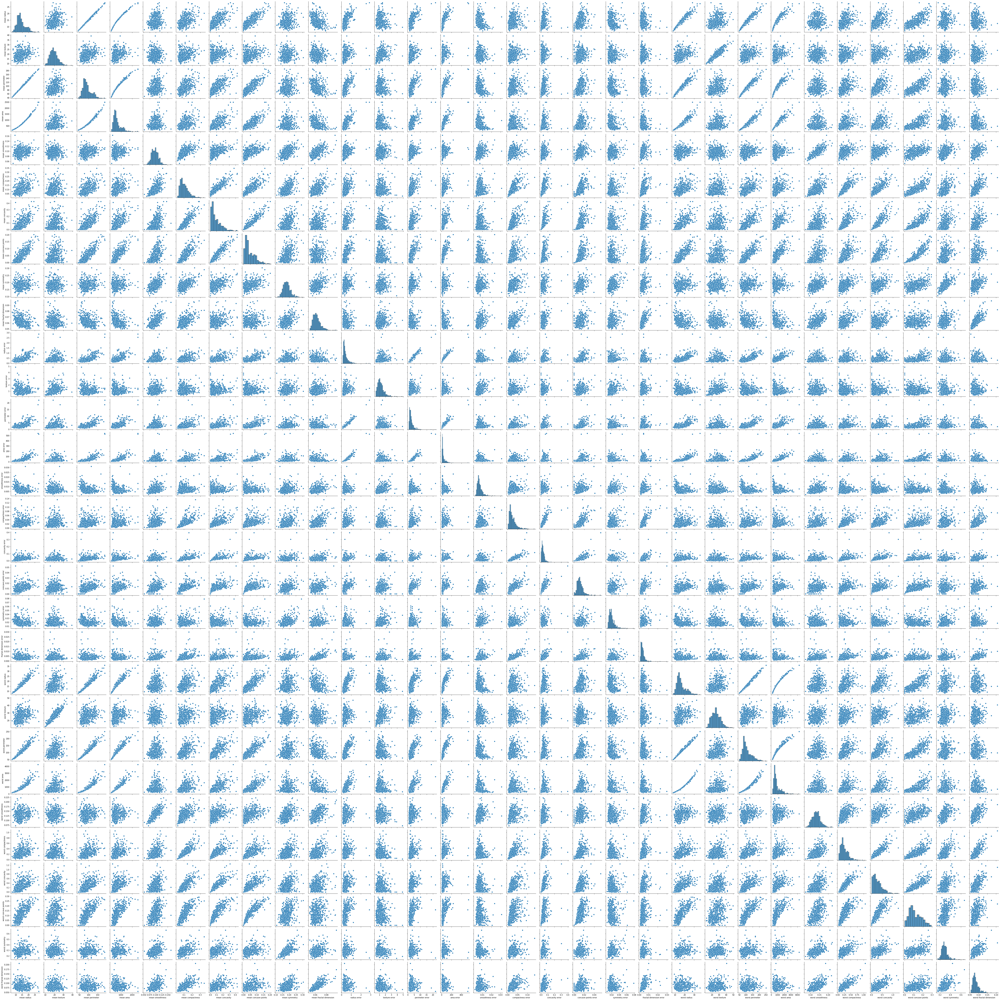

In [8]:
%%time
sns.pairplot(data=df)

Além do comando acima ter demorado uma quantidade considerável de tempo (mais de 4 minutos!!!) para um dataset relativamente pequeno, é extremamente longe do ideal para analisar a relação entre as variáveis do modelo e conseguir saber o que está separando ou não os dados. E é pra isso que vamos eventualmente utilizar o PCA!

*Obs: é claro que poderíamos nos estender aqui e falar sobre outros métodos que permitiriam analisar a correlação entre as diferentes variáveis ou então até mesmo plotar os dados de forma mais eficiente (em um caso real, talvez até faça sentido você fazer isso), porém meu ponto é que isso não é nada fácil nem corriqueiro, sendo que existem muitas variáveis e em um caso real podem existir muuuitas mais.*

### Normalizando os dados:

Sempre, o primeiro passo quando vamos realizar o PCA, é fazer a normalização dos dados, sendo um passo **necessário** para que a técnica funcione da forma correta. E é necessário porque o PCA vai separar os nossos dados em diferentes **PCs (Principal Components)**, e esses PCs buscam explicar a variação dos nossos pontos, sendo que o PC1 vai ser o PC que explica a maior variação, o PC2 a segunda maior e assim por diante (o número de PCs é igual ao número de variáveis explicativas do nosso modelo).

E, se tivermos dados não normalizados, ou seja, nossas variáveis explicativas possuem as mais diferentes magnitudes, a variação dos pontos acaba ficando meio poluída e sem sentido, sendo que em um eixo podemos variar entre 0 e 1 e no outro eixo entre 0 e 100000 então os PCs acabam sendo calculados de forma incorreta, já que o eixo que varia em magnitudes maiores poderia significar que ele explica a maior variação dos dados, o que pode não ser necessariamente verdade.

In [9]:
# Então, bora normalizar:

normalizador = StandardScaler()
normalizador.fit(df)

dados_normalizados = normalizador.transform(df)

df_normalizado = pd.DataFrame(data=dados_normalizados, columns=cancer['feature_names'])
df_normalizado.describe()

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
count,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,...,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02,5.690000e+02
mean,-3.153111e-15,-6.568462e-15,-6.993039e-16,-8.553985e-16,6.081447e-15,-1.136369e-15,-2.997017e-16,1.023981e-15,-1.860648e-15,-1.504752e-15,...,-2.297713e-15,1.742016e-15,-1.198807e-15,6.118909e-16,-5.094929e-15,-2.122887e-15,6.118909e-16,-1.998011e-16,-2.422589e-15,2.497514e-15
std,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,...,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00,1.000880e+00
min,-2.029648e+00,-2.229249e+00,-1.984504e+00,-1.454443e+00,-3.112085e+00,-1.610136e+00,-1.114873e+00,-1.261820e+00,-2.744117e+00,-1.819865e+00,...,-1.726901e+00,-2.223994e+00,-1.693361e+00,-1.222423e+00,-2.682695e+00,-1.443878e+00,-1.305831e+00,-1.745063e+00,-2.160960e+00,-1.601839e+00
25%,-6.893853e-01,-7.259631e-01,-6.919555e-01,-6.671955e-01,-7.109628e-01,-7.470860e-01,-7.437479e-01,-7.379438e-01,-7.032397e-01,-7.226392e-01,...,-6.749213e-01,-7.486293e-01,-6.895783e-01,-6.421359e-01,-6.912304e-01,-6.810833e-01,-7.565142e-01,-7.563999e-01,-6.418637e-01,-6.919118e-01
50%,-2.150816e-01,-1.046362e-01,-2.359800e-01,-2.951869e-01,-3.489108e-02,-2.219405e-01,-3.422399e-01,-3.977212e-01,-7.162650e-02,-1.782793e-01,...,-2.690395e-01,-4.351564e-02,-2.859802e-01,-3.411812e-01,-4.684277e-02,-2.695009e-01,-2.182321e-01,-2.234689e-01,-1.274095e-01,-2.164441e-01
75%,4.693926e-01,5.841756e-01,4.996769e-01,3.635073e-01,6.361990e-01,4.938569e-01,5.260619e-01,6.469351e-01,5.307792e-01,4.709834e-01,...,5.220158e-01,6.583411e-01,5.402790e-01,3.575891e-01,5.975448e-01,5.396688e-01,5.311411e-01,7.125100e-01,4.501382e-01,4.507624e-01
max,3.971288e+00,4.651889e+00,3.976130e+00,5.250529e+00,4.770911e+00,4.568425e+00,4.243589e+00,3.927930e+00,4.484751e+00,4.910919e+00,...,4.094189e+00,3.885905e+00,4.287337e+00,5.930172e+00,3.955374e+00,5.112877e+00,4.700669e+00,2.685877e+00,6.046041e+00,6.846856e+00


Veja que agora, diferentemente de antes, as médias estão todas centralizadas em torno de zero (são números extremamente pequenos), e o devio padrão em torno de 1.

### Rodando o PCA:

Com os dados normalizados, podemos realizar o PCA. E vou tentar explicar o que cada coisa significa conforme formos realizando o processo:

In [10]:
pca = PCA()
pca.fit(df_normalizado)
dados_pca = pca.transform(df_normalizado)

In [11]:
dados_pca.shape

(569, 30)

In [12]:
df_pca = pd.DataFrame(data=dados_pca,
                     columns=['PC'+str(i) for i in range(1,31)])
df_pca.head(10)

,PC1,PC2,PC3,PC4,PC5,PC6,PC7,PC8,PC9,PC10,...,PC21,PC22,PC23,PC24,PC25,PC26,PC27,PC28,PC29,PC30
0,9.192837,1.948583,-1.123166,3.633731,-1.195110,1.411424,2.159370,-0.398407,-0.157118,-0.877402,...,0.096515,0.068850,0.084519,-0.175256,-0.151020,-0.201503,-0.252585,-0.033914,0.045648,-0.047169
1,2.387802,-3.768172,-0.529293,1.118264,0.621775,0.028656,0.013358,0.240988,-0.711905,1.106995,...,-0.077327,-0.094578,-0.217718,0.011290,-0.170510,-0.041129,0.181270,0.032624,-0.005687,-0.001868
2,5.733896,-1.075174,-0.551748,0.912083,-0.177086,0.541452,-0.668166,0.097374,0.024066,0.454275,...,0.311067,-0.060309,-0.074291,0.102762,0.171158,0.004735,0.049569,0.047026,0.003146,0.000751
3,7.122953,10.275589,-3.232790,0.152547,-2.960878,3.053422,1.429911,1.059565,-1.405440,-1.116975,...,0.434193,-0.203266,-0.124105,0.153430,0.077496,-0.275225,0.183462,0.042484,-0.069295,-0.019937
4,3.935302,-1.948072,1.389767,2.940639,0.546747,-1.226495,-0.936213,0.636376,-0.263805,0.377704,...,-0.116545,-0.017650,0.139454,-0.005332,0.003062,0.039254,0.032168,-0.034786,0.005038,0.021214
5,2.380247,3.949929,-2.934877,0.941037,-1.056042,-0.451039,0.490445,-0.165444,-0.133473,-0.530431,...,-0.002402,-0.101169,0.033478,0.002840,0.122390,-0.030299,-0.084455,0.000730,-0.019721,0.003459
6,2.238883,-2.690031,-1.639913,0.149340,0.040360,-0.128948,-0.301567,0.083698,-0.080025,0.219143,...,-0.049748,0.091046,-0.142980,-0.080184,-0.277661,-0.026748,0.020763,-0.046774,-0.012980,0.005473
7,2.143299,2.340244,-0.871947,-0.127043,-1.427437,-1.257039,0.974100,-0.653338,0.248184,1.000586,...,0.044655,-0.131358,-0.240479,0.096334,-0.195483,-0.059466,0.066680,0.026176,-0.002862,0.001698
8,3.174924,3.391813,-3.119986,-0.601297,-1.522290,0.559545,-0.215104,-0.687341,0.511924,0.029187,...,0.095700,0.196322,-0.058725,-0.088554,0.130342,-0.055048,0.038324,0.037160,0.011709,0.005281
9,6.351747,7.727174,-4.341916,-3.375202,1.710263,-0.723909,2.519840,0.365149,-0.717397,-1.165631,...,-0.256677,-0.716717,0.167328,0.216032,0.134778,0.311094,-0.002852,0.135732,0.037788,0.003827


Ok, vamos falar sobre o que temos aqui...

Por meio da técnica do SVD, conseguimos realizar o PCA. E isso foi feito, bem superficialmente, da seguinte maneira:

Foram sendo criadas linhas de *best fit* ortogonais nos nossos dados, e os valores referentes a cada uma dessas linhas são cada um dos PCs, sendo que o primeiro PC é o PC que melhor explica a variação dos nossos dados e assim por diante. Cada um desses PCs é composto, portanto, de uma relação entre todas as variáveis explicativas do modelo. <br><br>

Um engano comum é achar que cada PC é relacionado uma das variáveis explicativas do modelo original, mas não, esse entendimento é completamente errado, não é certo pensar que o PC1 seria uma das variáveis explicativas originais, o PC2 seria outra e etc, tente entender os PCs como se fossem variáveis explicativas alternativas às originais, sendo que, por meio de elas serem composta pelo relacionamento entre as originais (são combinações lineares de nossas variáveis originais), tenta capturar, em um único PC, o efeito de várias variáveis de uma vez só, portanto, poderíamos, e esse é o intuito, diminuir a quantidade de variáveis do nosso modelo, deixando de usar as 30 variáveis explicativas, para usar apenas alguns PCs.

E, por exemplo, quando queremos plotar os dados que estão compostos por diversas variáveis explicativas, podemos usar os dois primeiros PCs para constituir um gráfico! E vamos fazer isso mais pra frente, mas antes, vamos falar de mais algumas coisas e fazer algumas análises dos nossos PCs.

### Analisando os Componentes Principais:

Os componentes principais, como eu disse, vão tentar capturar os efeitos de todas as variáveis explicativas nos primeiros. E esse efeito pode ser quantificado por meio de algo chamado **Scree Plot**. Que basicamente vai falar o % de explicação de cada PC dentro da variação dos pontos do nosso modelo. Vamos dar uma olhada:

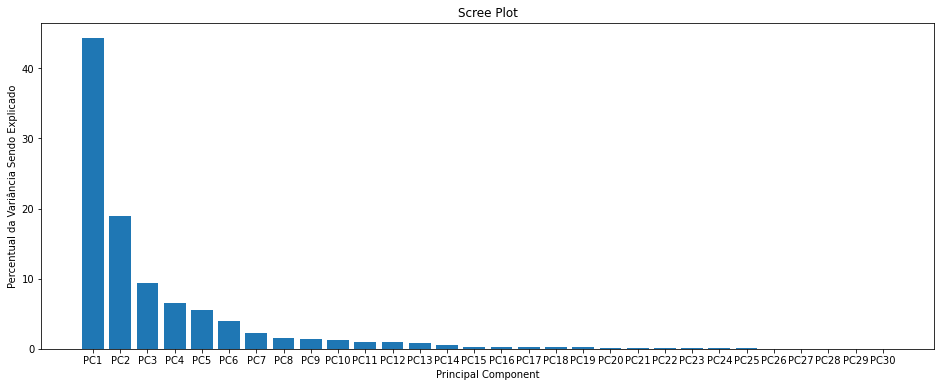

In [13]:
# Lista que vai conter o quanto cada PC explica da variância dos pontos:
lista_percentual_explicado = np.round(pca.explained_variance_ratio_* 100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(lista_percentual_explicado)+1)]
 
plt.figure(figsize=(16,6))
plt.bar(x=range(1, len(lista_percentual_explicado) + 1), height=lista_percentual_explicado, tick_label=labels)
plt.ylabel('Percentual da Variância Sendo Explicado')
plt.xlabel('Principal Component')
plt.title('Scree Plot')
plt.show()

Hmm... Vejamos que interessante, o PC1 é responsável por explicar cerca de 40% da variação dos nossos dados, enquanto o PC30 é praticamente neglicenciável! E é justamente assim que conseguimos reduzir a dimensionalidade, vendo quais PCs podem ser neglicenciáveis e utilizando só os que explicam mais!

*Obs.: é relativamente comum pegar todos os PCs que expliquem até cerca de 95% ou 99% da variância dos dados*.

Além disso, podemos verificar quais variáveis explicativas originais do modelo são mais representativas na explicação de cada um dos componentes! Vou fazer isso através de um `heatmap` para os primeiros 5 PCs.

In [14]:
# Primeiro vou criar um DF com o peso de cada variável dentro de cada um dos PCs:

df_componentes = pd.DataFrame(data=pca.components_,columns=cancer['feature_names']).abs() # Trago o valor em módulo
df_componentes

,mean radius,mean texture,mean perimeter,mean area,mean smoothness,mean compactness,mean concavity,mean concave points,mean symmetry,mean fractal dimension,...,worst radius,worst texture,worst perimeter,worst area,worst smoothness,worst compactness,worst concavity,worst concave points,worst symmetry,worst fractal dimension
0,0.218902,0.103725,0.227537,0.220995,0.142590,0.239285,0.258400,0.260854,0.138167,0.064363,...,0.227997,0.104469,0.236640,0.224871,0.127953,0.210096,0.228768,0.250886,0.122905,0.131784
1,0.233857,0.059706,0.215181,0.231077,0.186113,0.151892,0.060165,0.034768,0.190349,0.366575,...,0.219866,0.045467,0.199878,0.219352,0.172304,0.143593,0.097964,0.008257,0.141883,0.275339
2,0.008531,0.064550,0.009314,0.028700,0.104292,0.074092,0.002734,0.025564,0.040240,0.022574,...,0.047507,0.042298,0.048547,0.011902,0.259798,0.236076,0.173057,0.170344,0.271313,0.232791
3,0.041409,0.603050,0.041983,0.053434,0.159383,0.031795,0.019123,0.065336,0.067125,0.048587,...,0.015417,0.632808,0.013803,0.025895,0.017652,0.091328,0.073951,0.006007,0.036251,0.077053
4,0.037786,0.049469,0.037375,0.010331,0.365089,0.011704,0.086375,0.043861,0.305941,0.044424,...,0.004407,0.092883,0.007454,0.027391,0.324435,0.121804,0.188519,0.043332,0.244559,0.094423
5,0.018741,0.032179,0.017308,0.001888,0.286374,0.014131,0.009344,0.052050,0.356458,0.119431,...,0.000291,0.050008,0.008501,0.025164,0.369255,0.047706,0.028379,0.030873,0.498927,0.080224
6,0.124088,0.011400,0.114477,0.051653,0.140669,0.030918,0.107520,0.150482,0.093891,0.295760,...,0.009710,0.009871,0.000446,0.067832,0.108831,0.140473,0.060488,0.167967,0.018491,0.374658
7,0.007452,0.130675,0.018687,0.034674,0.288975,0.151396,0.072827,0.152322,0.231531,0.177121,...,0.042619,0.036252,0.030559,0.079394,0.205852,0.084020,0.072468,0.036171,0.228225,0.048361
8,0.223110,0.112699,0.223739,0.195586,0.006425,0.167841,0.040591,0.111971,0.256040,0.123741,...,0.112141,0.103341,0.109614,0.080732,0.112316,0.100678,0.161909,0.060488,0.064638,0.134174
9,0.095486,0.240934,0.086386,0.074956,0.069293,0.012936,0.135602,0.008055,0.572069,0.081103,...,0.077362,0.029551,0.050508,0.069921,0.128305,0.172134,0.311639,0.076648,0.029563,0.012610


O que temos acima é um DF sendo que as colunas são as variáveis explicativas do modelo original, e cada linha representa um PC em ordem respectiva, porém com indexação a partir de 0, e os valores são, de forma simples, a influência de cada variável dentro daquele PC! Vamos plotar um heatmap para tentar tornar isso mais claro:

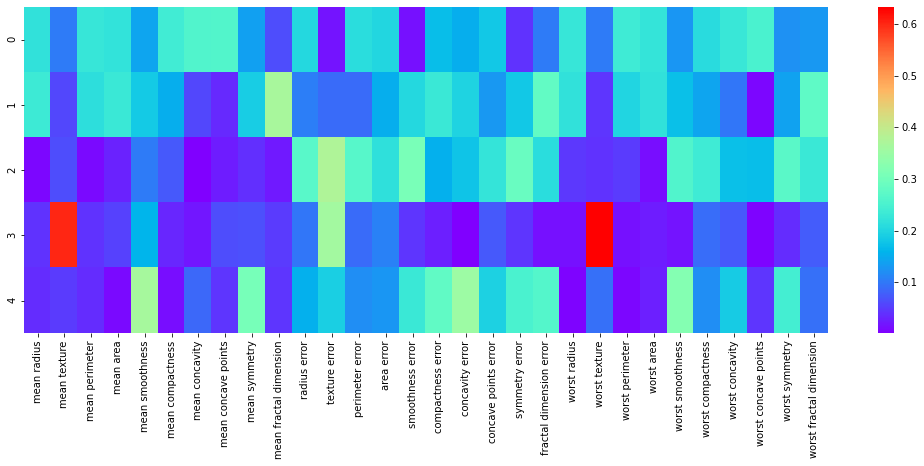

In [15]:
plt.figure(figsize=(18,6))
sns.heatmap(df_componentes.head(5),cmap='rainbow')

Tendo analisado os PCs, o que podemos fazer também é plotar os dados usando somente os 2 primeiros PCs! Assim conseguindo visualizar os dados sem ter que tentar utilizar aquele `pairplot` nada prático!

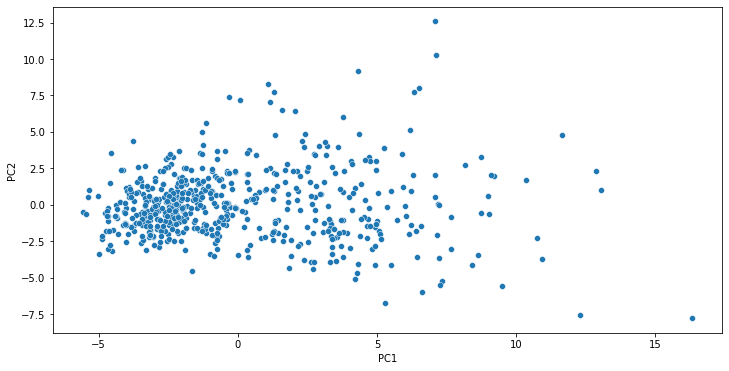

In [16]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=df_pca,
               x='PC1',
               y='PC2')

Melhor ainda, podemos separar os dados de acordo com a classificação que veio no nosso dataset:

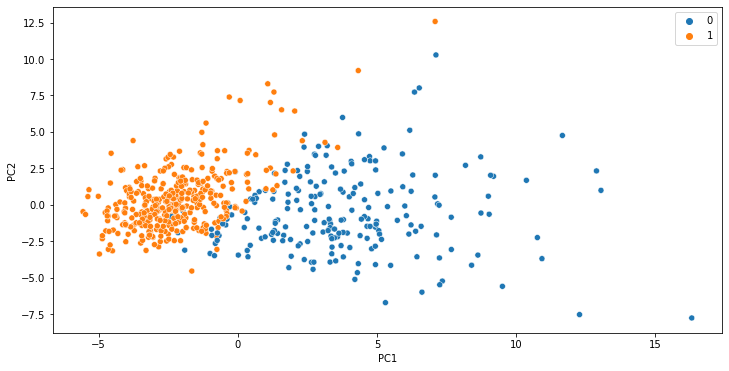

In [17]:
plt.figure(figsize=(12,6))
sns.scatterplot(data=df_pca,
               x='PC1',
               y='PC2',
               hue=cancer['target'])

Ver os dados desse jeito sem dúvida é muito melhor do que o nosso pairplot anterior, mas, claro, endereçando a desvantagem de fazer isso é que perdemos a fácil interpretabilidade das nossas variáveis originais pra algo de muito mais difícil interpretação que são os diferentes PCs!

## Conclusão

Para finalizar, em suma, vimos que o PCA é uma técnica de transformação dos dados que, por consequência de suas definições, pode acabar sendo utilizada para a **redução da dimensionalidade**, porém, com o custo de não ser possível ter uma entendimento muito profundo do que cada PC de fato significa.

Espero ter conseguido lhe passar, pelo menos um pouco do conteúdo conceitual e ter demonstrado como realizar a aplicação do PCA e análise dos PCs. Como eu disse anteriormente, caso você tenha interesse de, de fato entender o assunto (que, de longe não foi esgotado neste notebook) recomendo que veja, ao menos, os links que vou deixar no apêndice.

Em casos de dúvidas ou sugestões, sinta-se livre para entrar em contato comigo no Reddit.

Criado por: <br><br>

Reddit: **u/_jvsm**

# Apêndice:

[Excelente vídeo sobre o funcionamento do PCA por meio do SVD](https://www.youtube.com/watch?v=FgakZw6K1QQ)

[Outro ótimo vídeo que explica o funcionamento do PCA e sua aplicação no R](https://www.youtube.com/watch?v=TJdH6rPA-TI)

[Artigo sobre PCA, incluindo um pouco da matemática por trás](https://builtin.com/data-science/step-step-explanation-principal-component-analysis)